In [1]:
"""
Author: Peter Hlivka
Computer vision
Task 2.
2020
"""

'\nAuthor: Peter Hlivka\nComputer vision\nTask 2.\n2020\n'

In [20]:
import numpy as np
from skimage import data, exposure,filters, io, color,img_as_uint
from skimage.exposure import cumulative_distribution

import matplotlib.pyplot as plt
from skimage.morphology import disk
#import cv2 
import os
from resizeimage import resizeimage
from PIL import Image
from skimage.color import rgb2gray
from skimage.exposure import match_histograms
from IPython.display import Math


ModuleNotFoundError: No module named 'resizeimage'

<Figure size 1080x360 with 0 Axes>

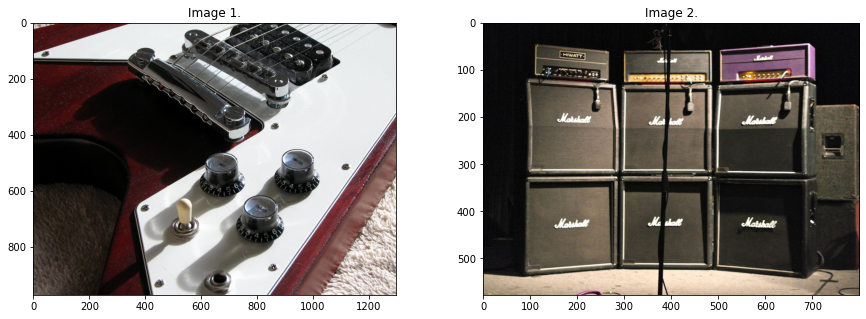

<Figure size 1080x360 with 0 Axes>

In [3]:
#Nacitanie obrazkov pre prve znazornenia matchingu.
im_1 = io.imread("gibson_v.jpg")
im_2 = io.imread("ampwall.jpg")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(im_1)
plt.title("Image 1.")
plt.subplot(122)
plt.imshow(im_2)
plt.title("Image 2.")
plt.figure(figsize=(15, 5))


In [4]:
#V prvom kroku si prisbosobime obrazky na pozadovanu velkost, aby sme si najprv vyskusali pracu s mriezkov s rovnakymi rozmermi.
#Praci s roznymi velkostami obrazkov sa budeme venovat po implementovani obrazkov do algoritmu s rovnakym rozmerom.
with open('gibson_v.jpg', 'r+b') as f:
    with Image.open(f) as image:
        cover = resizeimage.resize_cover(image, [600, 400])
        cover.save('new_gibson.jpeg', image.format)
        
with open('ampwall.jpg', 'r+b') as f:
    with Image.open(f) as image:
        cover = resizeimage.resize_cover(image, [600, 400])
        cover.save('new_marshall.jpeg', image.format)
        
        

Text(0.5, 1.0, 'Target image')

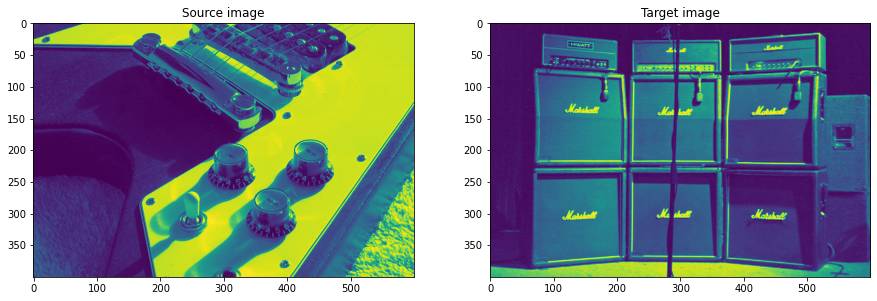

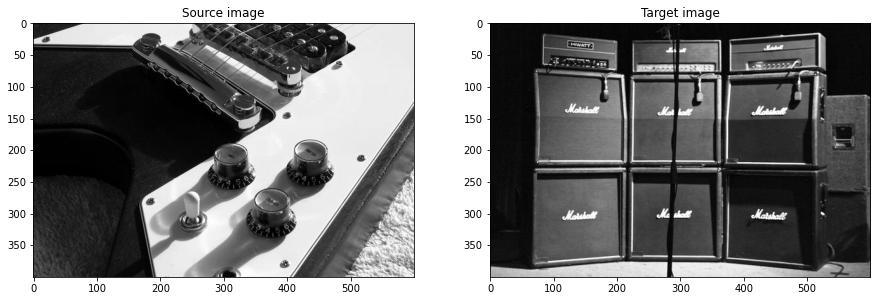

In [5]:
source_i = io.imread("new_gibson.jpeg")
target_i = io.imread("new_marshall.jpeg")
source_im = (rgb2gray(source_i )*255).astype(dtype=np.uint8)
target_im = (rgb2gray(target_i)*255).astype(dtype=np.uint8)
#Viem pouzit aj tento zapis:
#source_i = io.imread("new_marshall.jpeg",as_gray='True')
#target_i = io.imread("new_gibson.jpeg",as_gray='True')
#Vyvtovrenie sedotonovych obrazkov 'as_gray = True' je rovnake ako nasledujuce zapisy:
#im_11 = 0.2126 * im_1[:,:,0] + 0.7152 * im_1[:,:,1] + 0.0722 * im_1[:,:,2]
#im_11 = im_11.astype(dtype=np.uint8)
#im_21 = 0.2126 * im_2[:,:,0] + 0.7152 * im_2[:,:,1] + 0.0722 * im_2[:,:,2]
#im_21 = im_21.astype(dtype=np.uint8)
# img = color.rgb2gray(io.imread('new_marshall.jpg'))
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im)
plt.title("Source image")
plt.subplot(122)
plt.imshow(target_im)
plt.title("Target image")
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im,cmap='gray')
plt.title("Source image")
plt.subplot(122)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")

Text(0.5, 1.0, 'Histogram of target image')

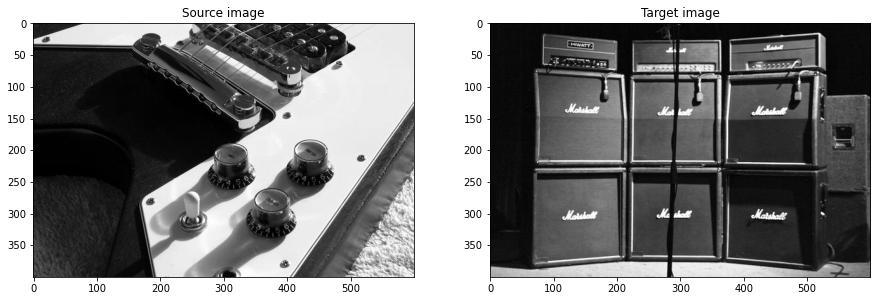

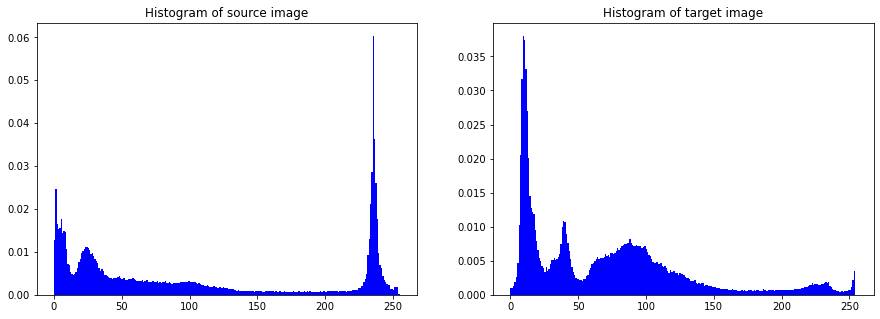

In [6]:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im,cmap='gray')
plt.title("Source image")
plt.subplot(122)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.figure(figsize=(15, 5))
plt.subplot(121)
s_hist = plt.hist(source_im.ravel(), bins=256, histtype='bar', color='blue',density=True)
plt.title("Histogram of source image")
plt.subplot(122)
t_hist = plt.hist(target_im.ravel(), bins=256, histtype='bar', color='blue',density=True)
plt.title("Histogram of target image")

Text(0.5, 1.0, 'Histogram of target image')

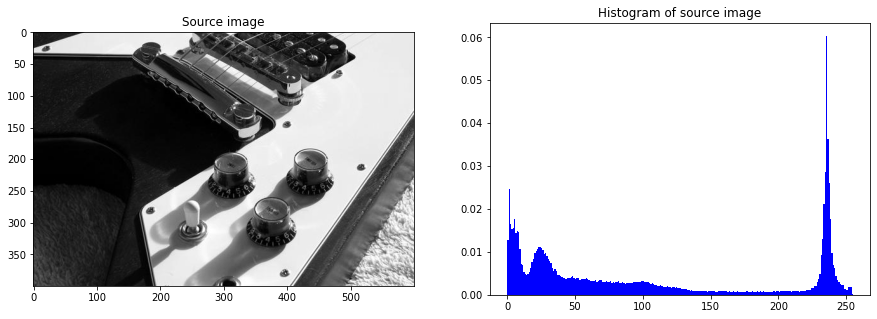

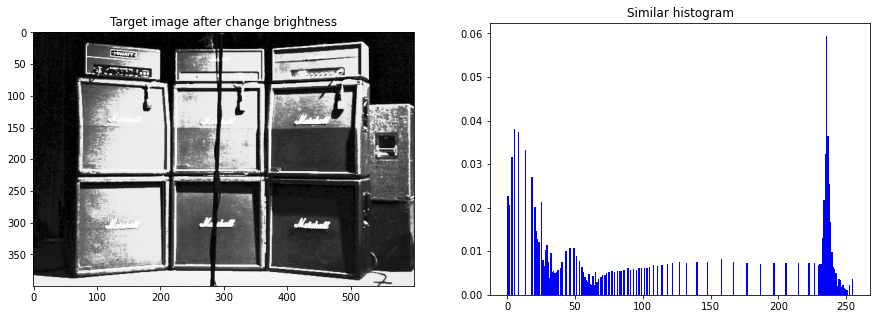

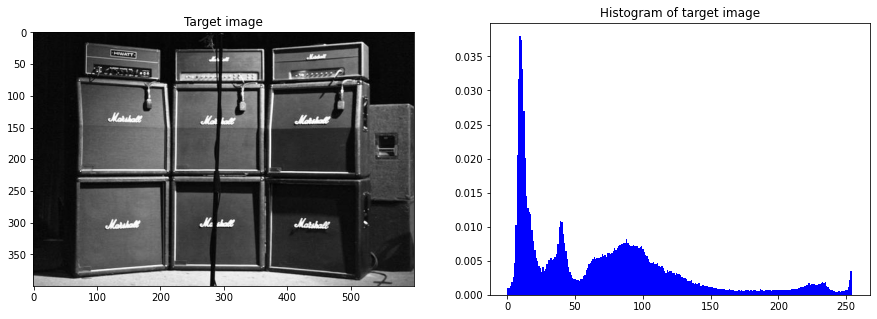

In [7]:
#Vyuzitie funkcie match_histograms z kniznice exposure pre porovnanie vysledkov s nami vytvorenym algoritmom
matched = match_histograms(target_im, source_im, multichannel=False)
#Zobrazenie:
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = plt.hist(source_im.ravel(), bins=256, histtype='bar', color='blue',density=True)
plt.title("Histogram of source image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(matched,cmap='gray')
plt.title("Target image after change brightness")
plt.subplot(122)
plt.hist(matched.ravel(), bins=256, color='blue',histtype='bar',density=True)
plt.title("Similar histogram")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = plt.hist(target_im.ravel(), bins=256, histtype='bar', color='blue',density=True)
plt.title("Histogram of target image")

In [8]:
#Vytvorime funkcie pre cumulativny sucet (funkciu budeme vyuzivat v nasledujucich krokoch).
def my_cumsum(i):
    i = iter(i)
    p = [next(i)]
    for j in i:
        p.append(p[-1] + j)
    return np.array(p)

Text(0.5, 1.0, 'My target histogram')

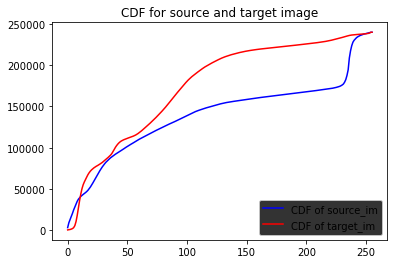

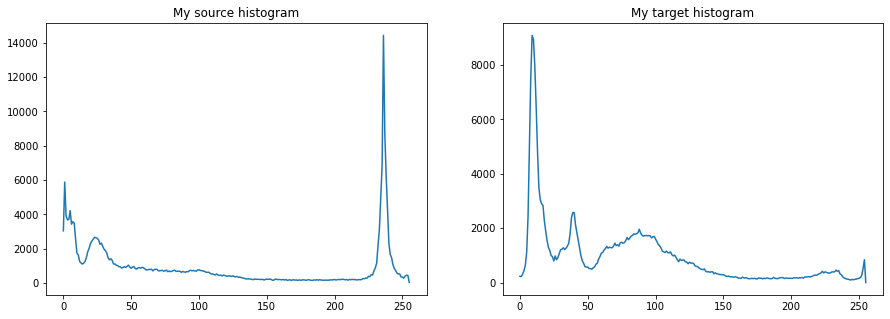

In [9]:
#Vytvorenie vlastnej funkcii pre histogram nie je potrebne, ale pre overenie vystupov vytvorime vlastnu funckiu my_hist, ktoru vyuzijeme v aplikacii v nasledujucich aplikacii.
#Vstupom funkcie je obrazok v pozadovanom formate a pocet bins (kosikov)
def my_hist(picture, bins):
    #Obrazok ako pole
    picture = np.asarray(picture)
    #vytvorene vektoru z 2D pola (jednorozmerne pole)
    picture = picture.flatten()
    #vytvorenie nuloveho pola pre kosiky
    hist = np.zeros(bins)
    #cyklus for pre priradenie jednotlivych hodnot z picture do pola
    for i in picture:
        hist[i] += 1
    return hist
hist_source_im = my_hist(source_im, 256)
hist_target_im = my_hist(target_im, 256)
#Komulativna distribucna funkcia, dalej uz len 'CDF', sa da zobrazit pre jednotlive vstupne obrazky funkciu cumsum (normalizacia)
cs = my_cumsum(hist_source_im)
ct = my_cumsum(hist_target_im)
cssp = plt.plot(cs, "-b")
cstp = plt.plot(ct,"-r")
plt.legend(['CDF of source_im','CDF of target_im'], facecolor="black", loc=4)
plt.title('CDF for source and target image')

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.plot(hist_source_im)
plt.title("My source histogram")
plt.subplot(122)
plt.plot(hist_target_im)
plt.title("My target histogram")


In [10]:
#Z uvedeneho zdroja v Task2 vyuzijeme vzorec pre kumulativny sucet:
display(Math(r'p_r(r_j) ={\frac{n_j}{N}}'))

<IPython.core.display.Math object>

Text(0.5, 1.0, 'My target histogram')

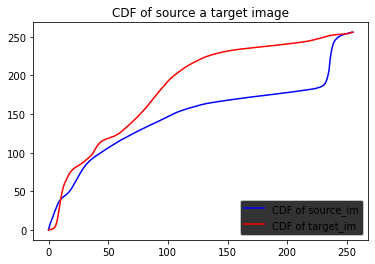

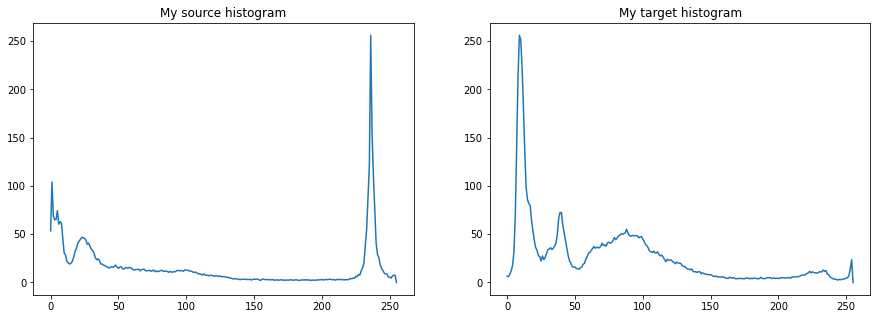

In [11]:
#Pre normalizaciu hodnot v danych histogramoch vyuzijeme funkciu my_normalized pre hodnoty nami zvolene vo funkcii v rozsahu od 0 do 256
def my_normalized(cums):
    # naasledujuce hodnoty vypocitam podal vzorca v cell 42.
    nj = (cums - cums.min()) * 256
    N = cums.max() - cums.min()
    cums = nj / N
    
    return cums

css = my_normalized(cs)
cst = my_normalized(ct)
cssp = plt.plot(css, "-b")
cstp = plt.plot(cst,"-r")
plt.legend(['CDF of source_im','CDF of target_im'], facecolor="black", loc=4)
plt.title("CDF of source a target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.plot(my_normalized(hist_source_im))
plt.title("My source histogram")
plt.subplot(122)
plt.plot(my_normalized(hist_target_im))
plt.title("My target histogram")

In [12]:
#Vytvorenie funkcie pre histogram matching
#Vstupne premenne:  t_cdf - CDF pre target_im, s_cdf - CDF pre source_im, picture - target_im

def my_matching(t_cdf,s_cdf, picture):
  
    #target = np.cumsum(target)
    #source = np.cumsum(source)
    #asarray - prepis obrazka do maticoveho tvaru - 2D pola
    picture =  np.asarray(picture)
    #vytvorenie vektoru z 2D pola (Vytvorenie 1D pole)
    picturef = picture.flatten()
    #picture = picture
    #arange - vytvorenie pola s 0 az 255 hodnotami
    array_1 = np.arange(256)
    #interp - vracia 1D linearny interpolant
    array_2 = np.interp(s_cdf, t_cdf, array_1,period=None) 
    #Vytvorenie noveho pola s vyuzitim funkcie reshape, kde vyuzivame interplonat nami zvoleneho pictue a tvar nami zvoleneho picture
    picture = (np.reshape(array_2[picturef], picture.shape)).astype(np.uint8)
    
    
    return picture


Pozitie vlastnych funkcii pre porovnanie.


Text(0.5, 1.0, 'Histogram of source image')

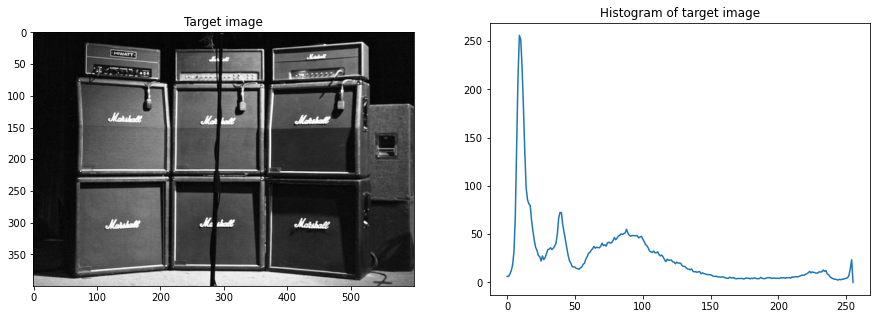

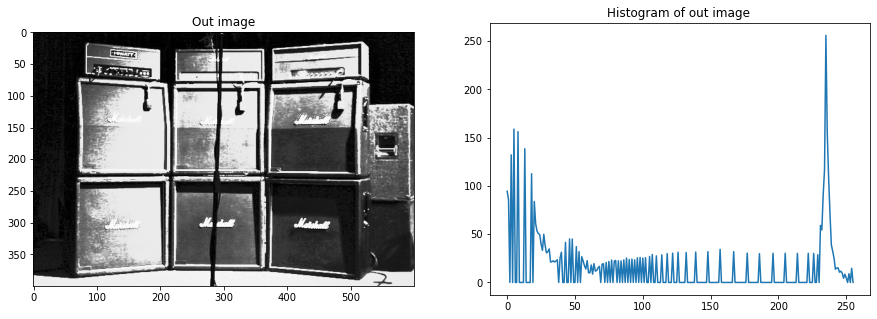

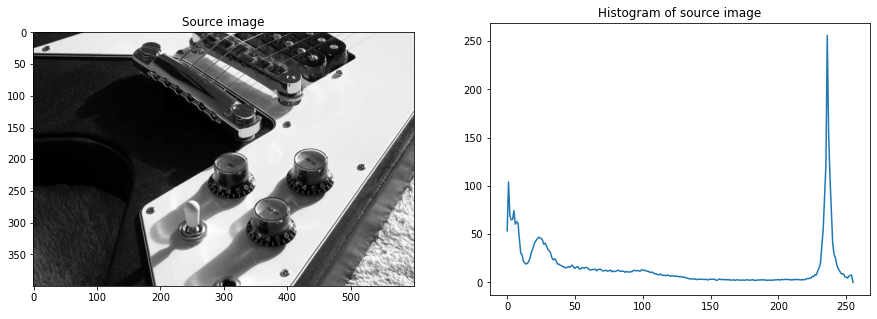

In [13]:
hist_s = my_hist(source_im,256)
hist_t = my_hist(target_im,256)

cdf_s = my_cumsum(hist_s)
cdf_t = my_cumsum(hist_t)

out_imm = my_matching(cdf_s,cdf_t, target_im)
print("Pozitie vlastnych funkcii pre porovnanie.")
plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_imm,cmap='gray')
plt.title("Out image")
plt.subplot(122)
plt.plot(my_normalized(my_hist(out_imm, 256)))
plt.title("Histogram of out image ")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

In [23]:
def adap_hist_matching(source_im,target_im,D):
    #ziskanie rozmerov vstupnych images.
    s_height,s_width = source_im.shape
    t_height,t_width = target_im.shape
    print('Width of source image is:{} and height is:{}\n'.format(s_width,s_height))
    print('Width of target image is:{} and height is:{}'.format(t_width,t_height))
    print('D is:{}'.format(D))
    #definovanie hodnot pociatocnych tiles pre ziskanie out_im.
    rows = target_im[0:D, 0:D]
    im_out = target_im[0:D, 0:D]
    
    #Tu som pouzil trojclenku pre vypocet jednotlivych rozmerov tiles source_im a target_im ak by doslo k matchingu s roznymi rozmermi images (Je nutny prepocet).
    h_per_tile = (D*100)/t_height
    w_per_tile = (D*100)/t_width
    
    out_h_tile = (s_height*h_per_tile)/100
    out_w_tile = (s_width*w_per_tile)/100
    
    plus_s_h = int(out_h_tile)
    plus_s_w = int(out_w_tile)
    #boolean premeny pre podmienky v cykloch
    ah = True
    ak = True
    #for loops pre matching a plotovanie jednotlivych tiles a histogramov.
    for h in range(0,t_height,D):
        w2 = 0
        for w in range(0,t_width,D):
            target_tile = target_im[h:h+D, w:w+D]
            source_tile = source_im[h:h+plus_s_h, w:w+plus_s_w]
            
            hist_st = my_hist(source_tile, 256)
            hist_tt = my_hist(target_tile, 256)
            
            cdf_st = my_cumsum(hist_st)
            cdf_tt = my_cumsum(hist_tt)
            
           
            out_tile = my_matching(cdf_st, cdf_tt, target_tile)
            
            
            
            hist_out = my_hist(out_tile, 256)
            hist_outn = my_normalized(hist_out)
            
            hist_ttn = my_normalized(hist_tt)
            hist_stn = my_normalized(hist_st)
            
            plt.figure(figsize=(25, 7))
            plt.subplot(261)
            plt.imshow(target_tile,cmap='gray')
            plt.title("Target tile")
            plt.subplot(262)
            plt.plot(hist_ttn)
            plt.title("Histogram of target tile")
            
            plt.subplot(263)
            plt.imshow(source_tile,cmap='gray')
            plt.title("Source tile")
            plt.subplot(264)
            plt.plot(hist_stn)
            plt.title("Histogram of source tile")
            plt.subplot(265)
            plt.imshow(out_tile,cmap='gray')
            plt.title("out tile")
            plt.subplot(266)
            plt.plot(hist_outn)
            plt.title("Histogram of out tile")
            
            if ah:
                ah = False
                rows = out_tile
            else:    
                rows = np.concatenate((rows,out_tile),axis=1)
                
                
        if ak:
            ak = False
            im_out = rows
        else:
            im_out = np.concatenate((im_out,rows),axis=0)
            
        rows = out_tile[0:D,0:D]
        np.delete(rows, 1)
        ah = True
    return im_out



Width of source image is:600 and height is:400

Width of target image is:600 and height is:400
D is:200


Text(0.5, 1.0, 'Histogram of source image')

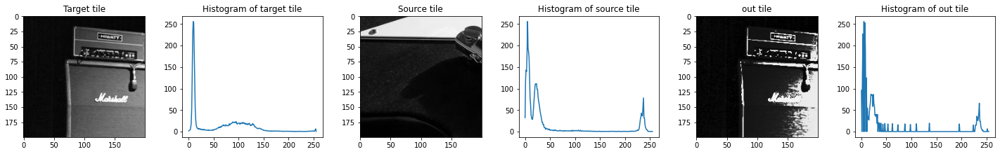

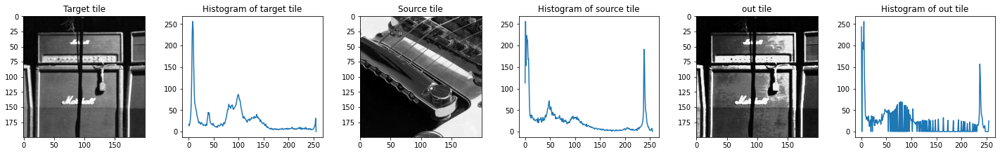

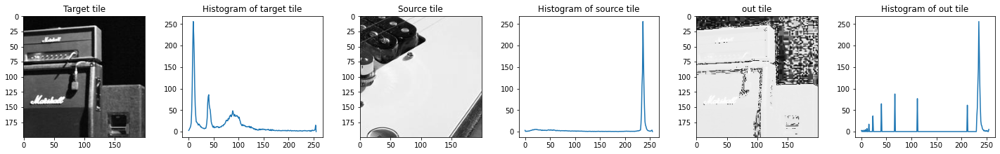

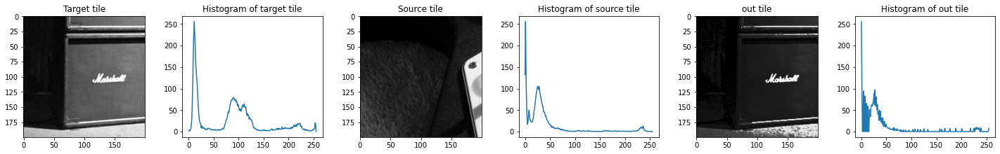

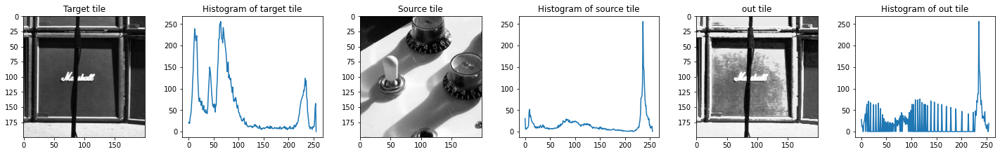

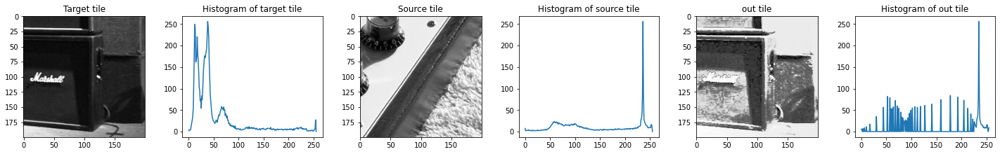

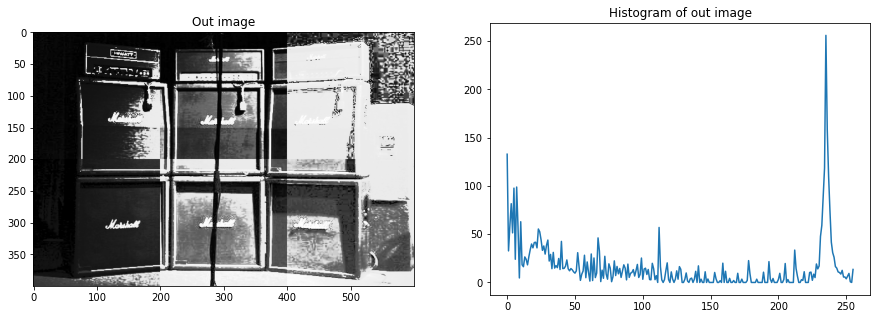

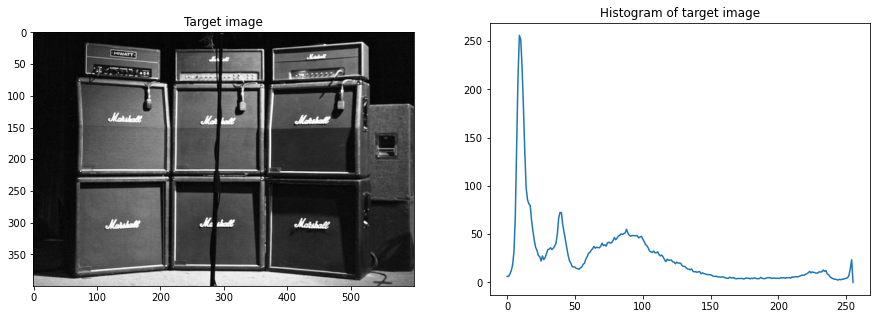

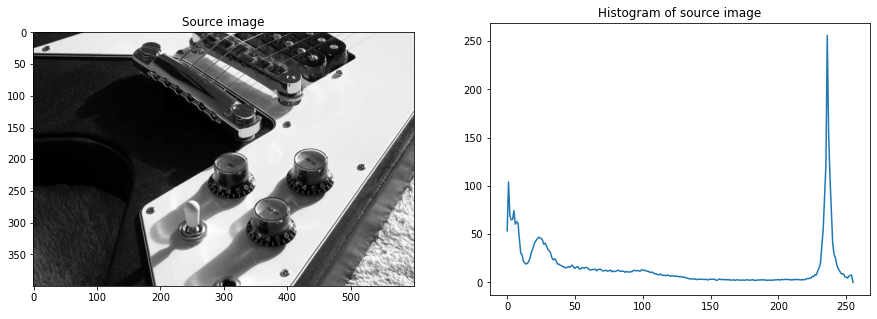

In [22]:
D = 200
out_im = adap_hist_matching(source_im,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im,cmap = 'gray')
plt.title("Out image")

out_hist = my_hist(out_im,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

Width of source image is:600 and height is:400

Width of target image is:600 and height is:400
D is:100


c:\users\peter\anaconda3\envs\cv\lib\site-packages\ipykernel_launcher.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Text(0.5, 1.0, 'Histogram of source image')

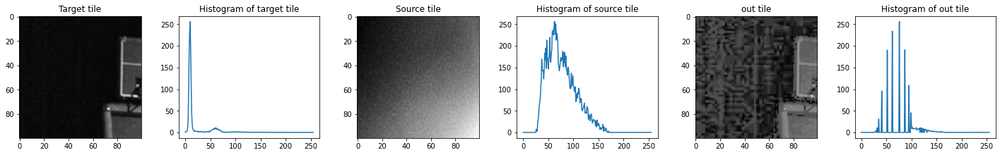

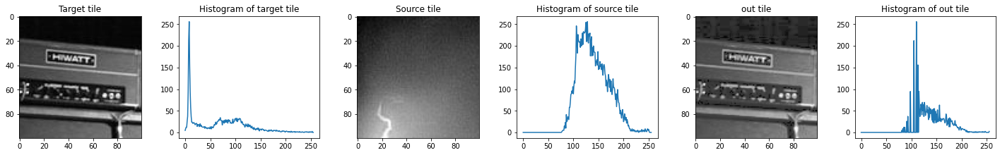

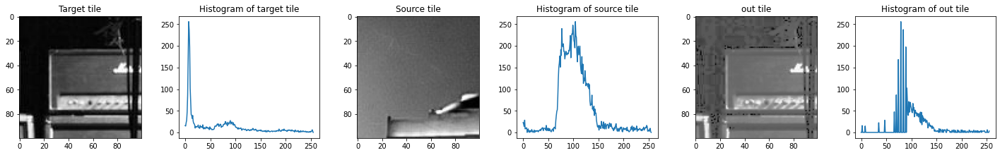

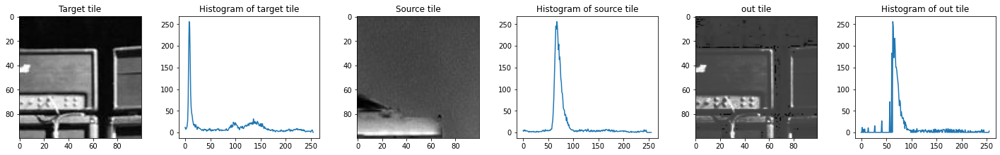

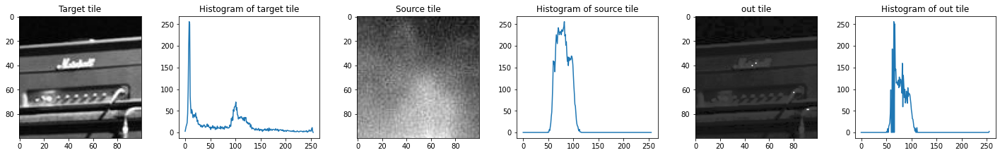

...

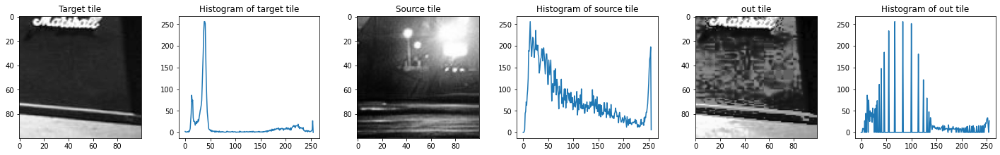

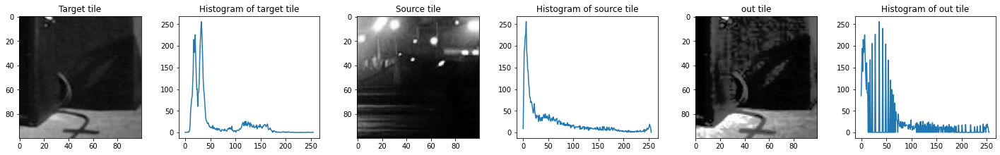

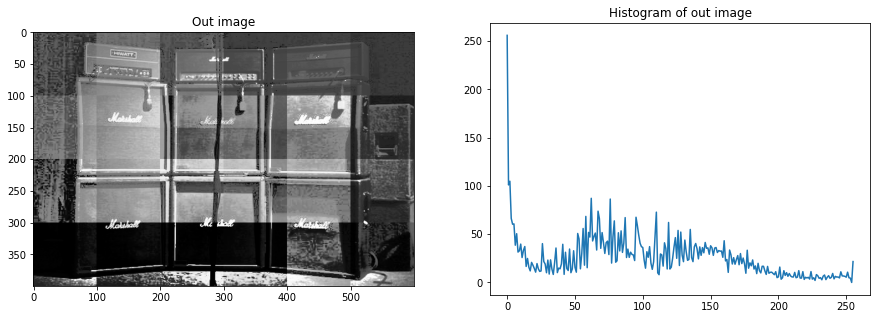

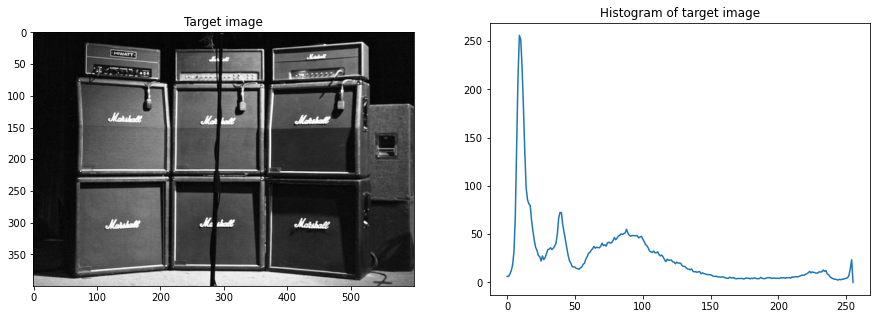

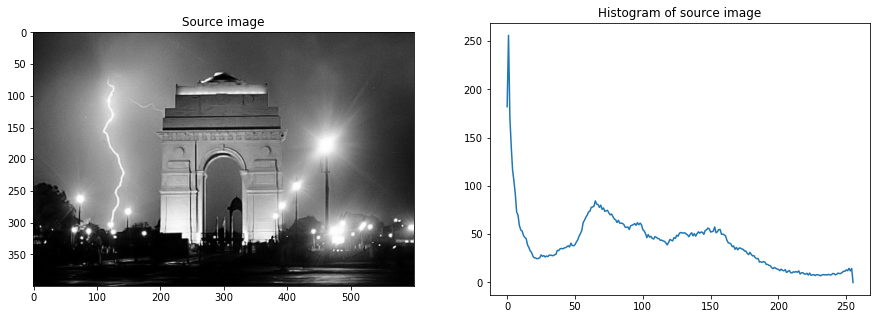

In [17]:
D = 100
source_i = io.imread("gate.jpg")
source_i = (rgb2gray(source_i)*255).astype(dtype=np.uint8)
out_im_2 = adap_hist_matching(source_i,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im_2,cmap = 'gray')
plt.title("Out image")

out_hist_2 = my_hist(out_im_2,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist_2))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_i,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_i, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

Width of source image is:1200 and height is:800

Width of target image is:600 and height is:400
D is:100


c:\users\peter\anaconda3\envs\cv\lib\site-packages\ipykernel_launcher.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Text(0.5, 1.0, 'Histogram of source image')

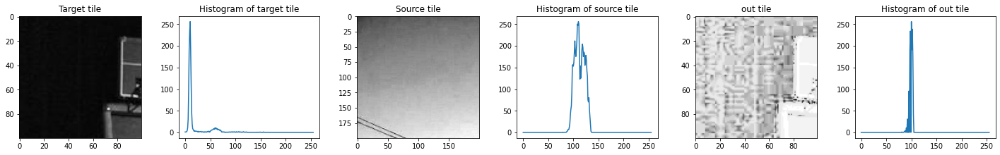

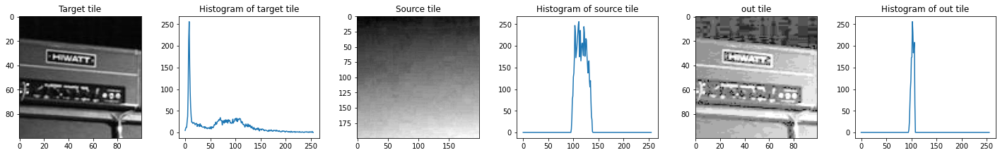

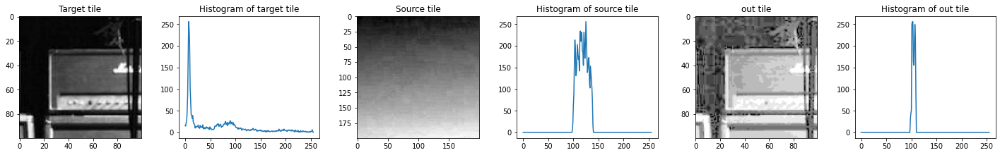

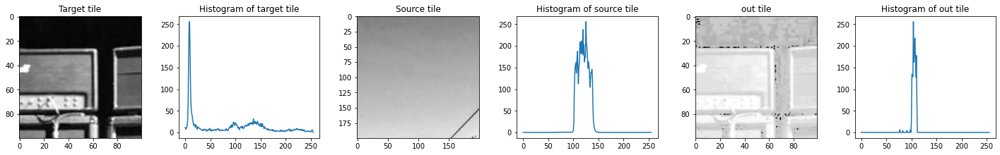

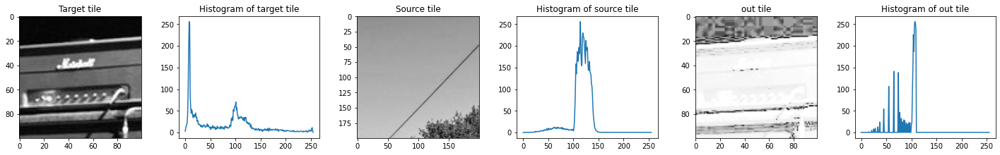

...

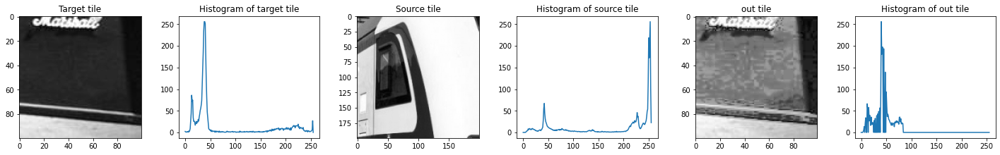

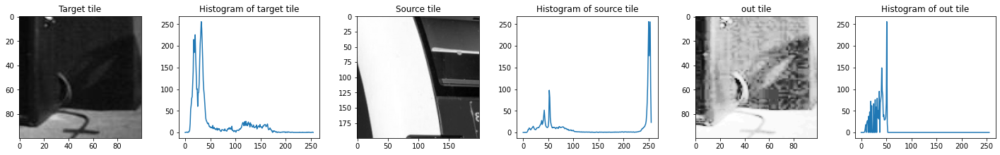

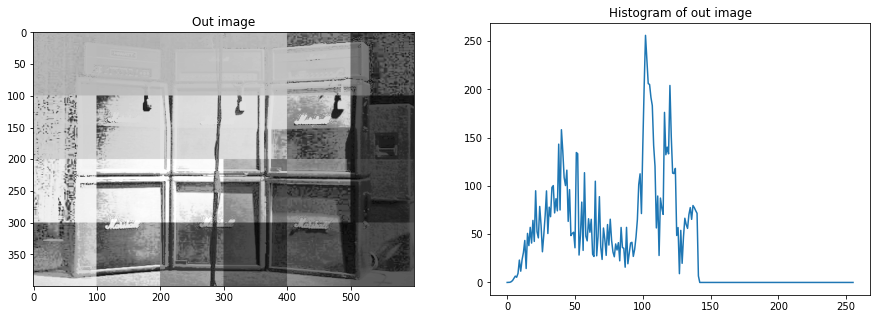

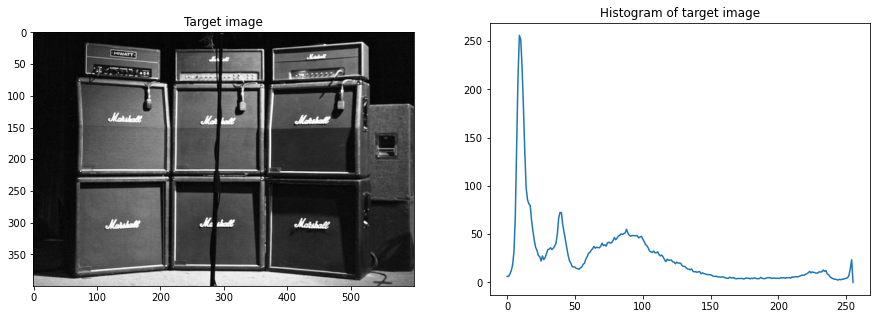

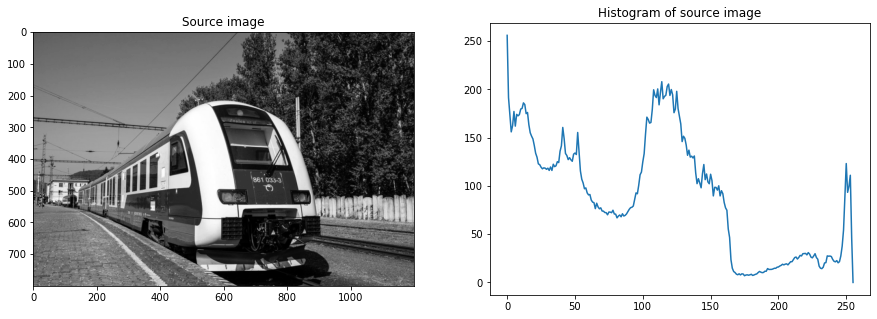

In [24]:
D = 100
source_im_3 = io.imread("train.jpg")
source_im3 = (rgb2gray(source_im_3)*255).astype(dtype=np.uint8)
out_im_3 = adap_hist_matching(source_im3,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im_3,cmap = 'gray')
plt.title("Out image")

out_hist_3 = my_hist(out_im_3,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist_3))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im3,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im3, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

Width of source image is:1200 and height is:800

Width of target image is:600 and height is:400
D is:200


Text(0.5, 1.0, 'Histogram of source image')

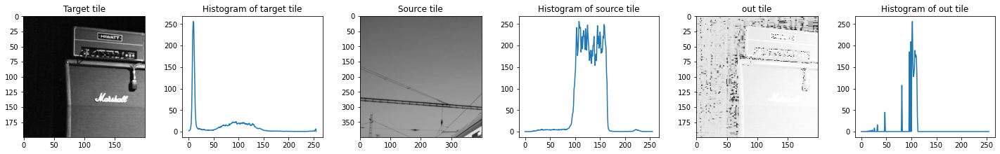

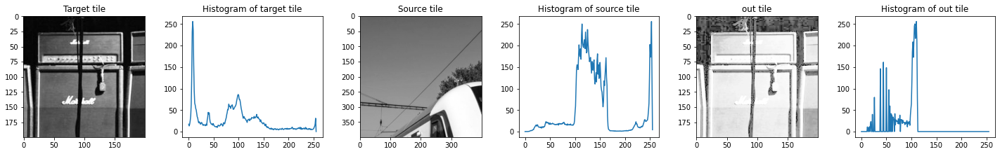

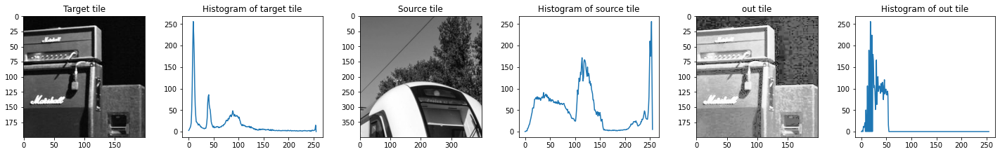

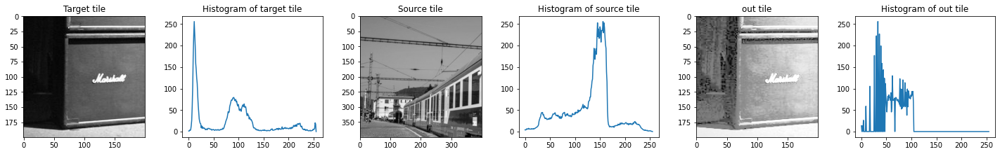

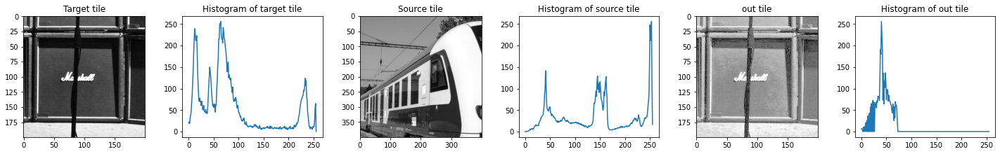

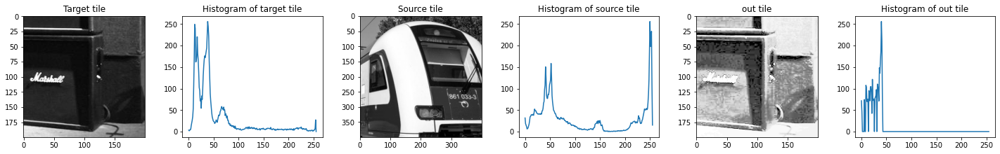

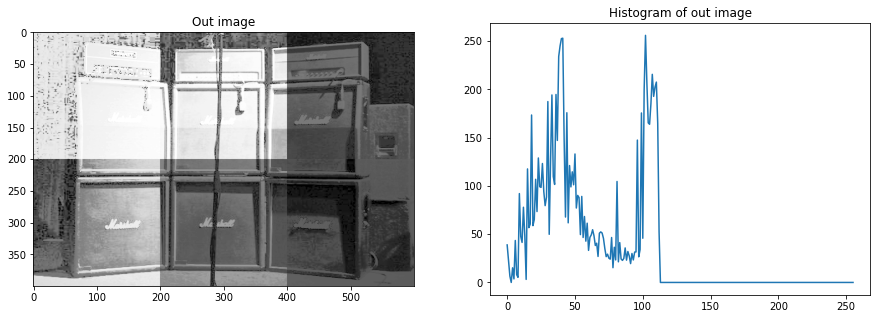

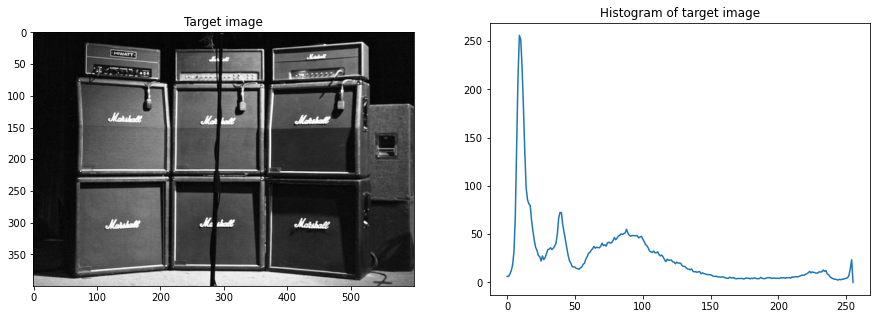

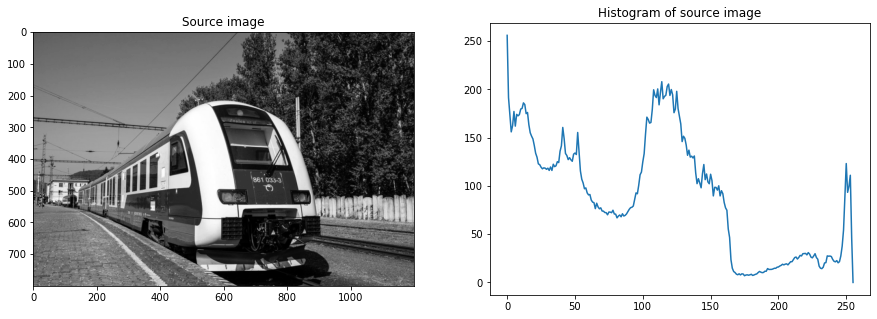

In [25]:
D = 200
source_im_3 = io.imread("train.jpg")
source_im3 = (rgb2gray(source_im_3)*255).astype(dtype=np.uint8)
out_im_3 = adap_hist_matching(source_im3,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im_3,cmap = 'gray')
plt.title("Out image")

out_hist_3 = my_hist(out_im_3,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist_3))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im3,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im3, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

c:\users\peter\anaconda3\envs\cv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  This is separate from the ipykernel package so we can avoid doing imports until


Width of source image is:1200 and height is:600

Width of target image is:600 and height is:400
D is:200


Text(0.5, 1.0, 'Histogram of source image')

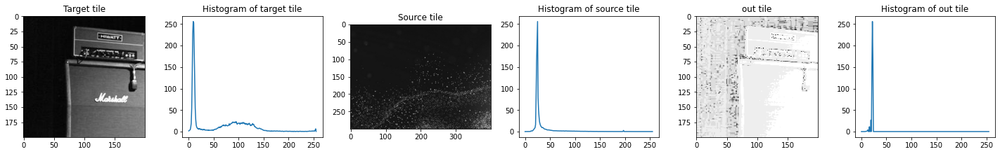

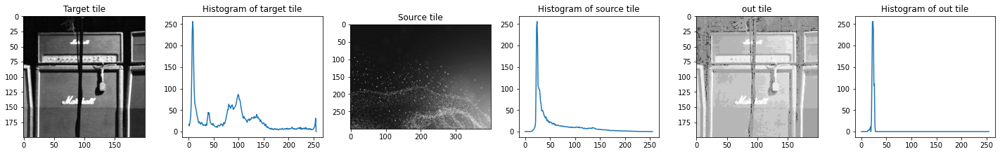

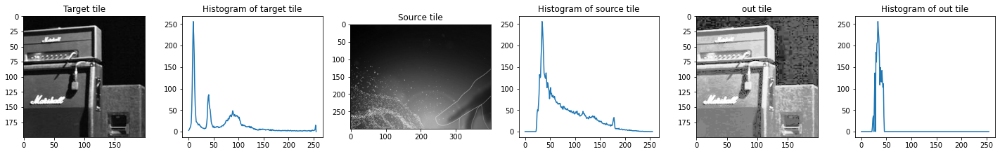

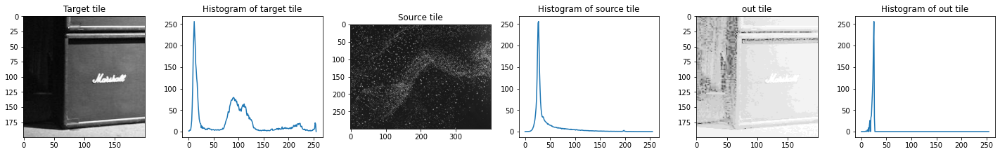

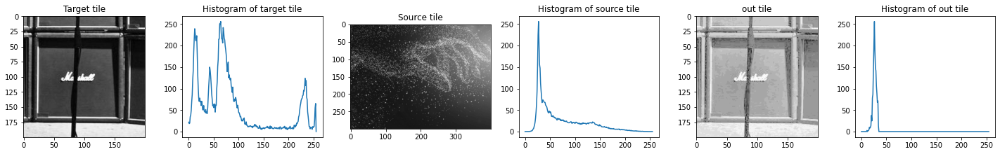

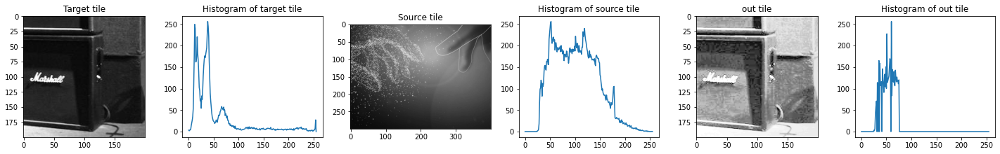

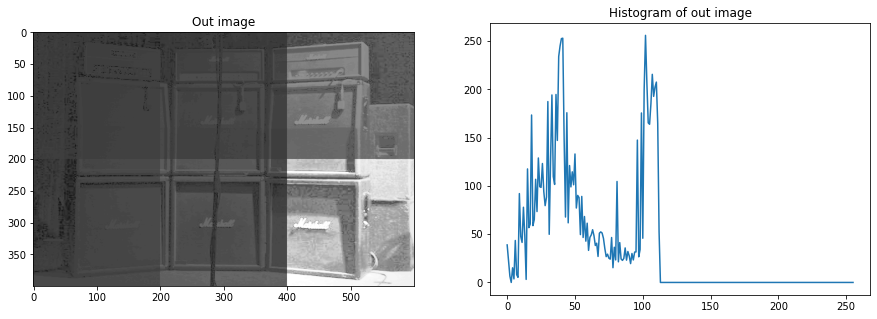

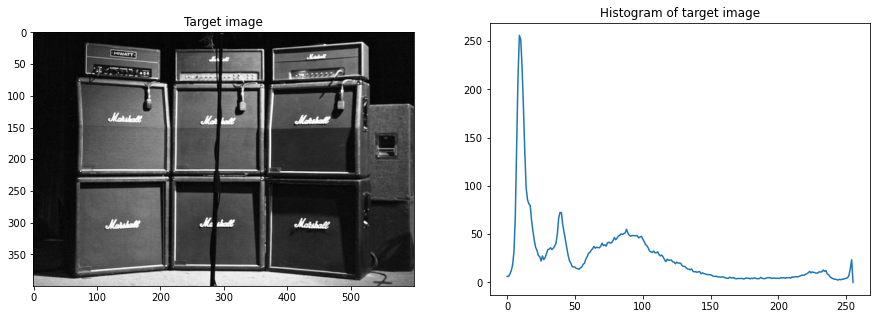

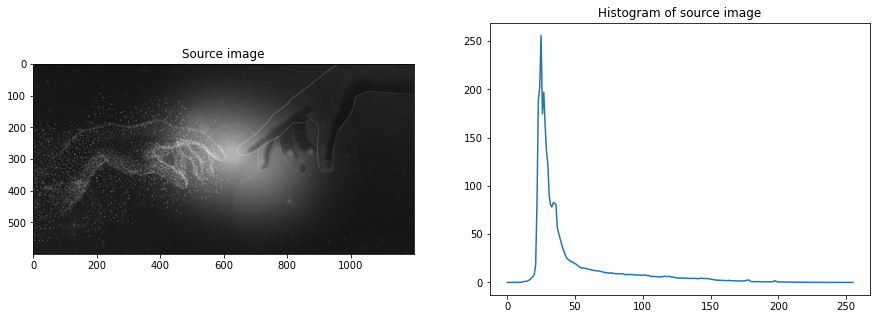

In [26]:
D = 200
source_im_4 = io.imread("hands.png")
source_im4 = (rgb2gray(source_im_4)*255).astype(dtype=np.uint8)
out_im_4 = adap_hist_matching(source_im4,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im_4,cmap = 'gray')
plt.title("Out image")

out_hist_4 = my_hist(out_im_3,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist_4))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im4,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im4, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")

Width of source image is:2000 and height is:1000

Width of target image is:600 and height is:400
D is:200


Text(0.5, 1.0, 'Histogram of source image')

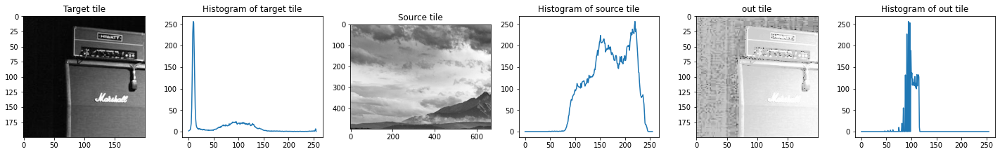

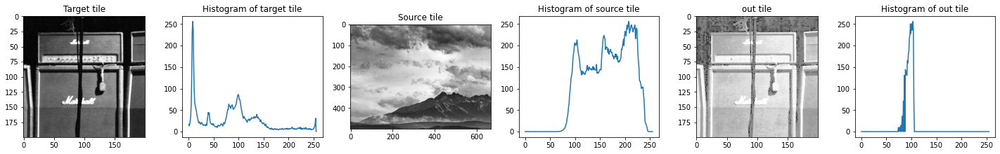

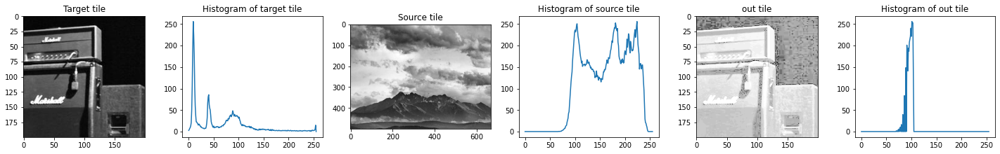

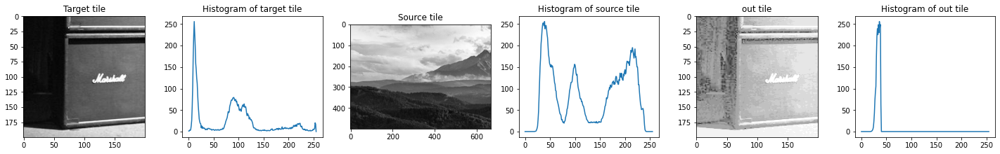

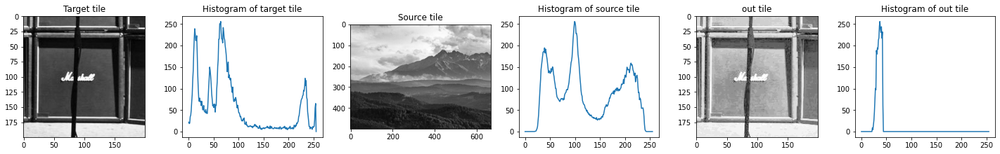

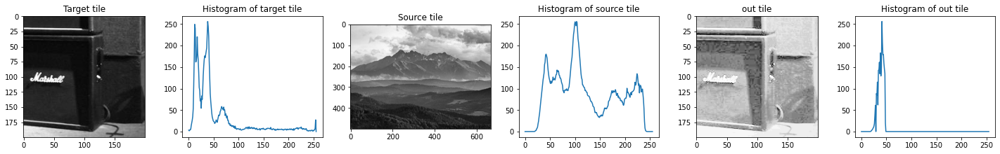

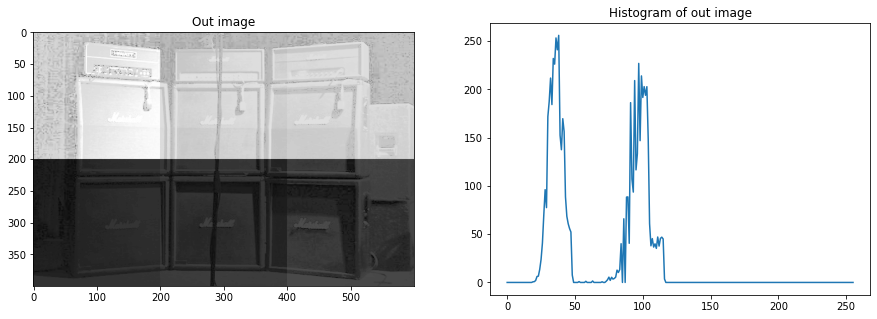

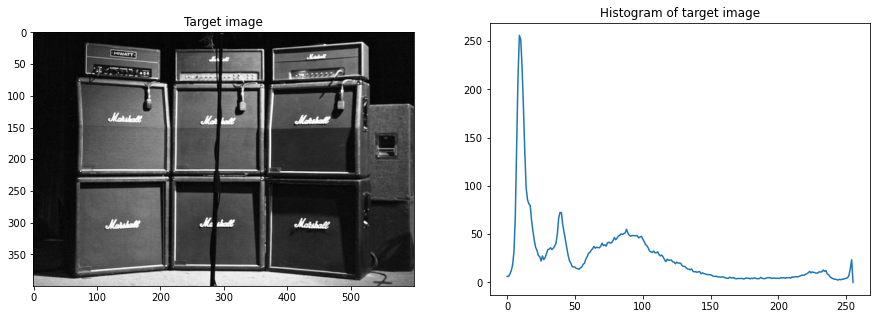

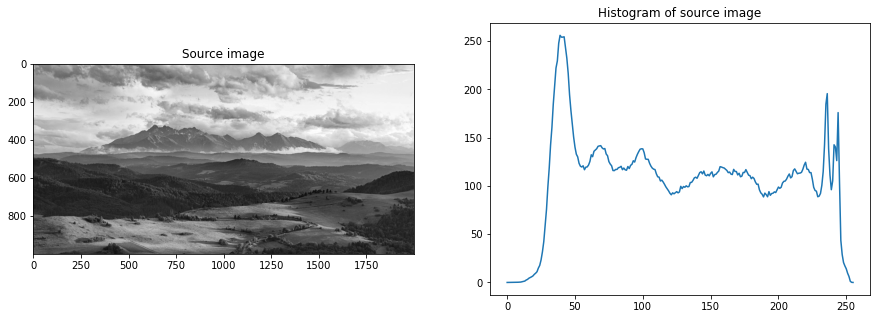

In [29]:
D = 200
source_im_5 = io.imread("mountains.jpg")
source_im5 = (rgb2gray(source_im_5)*255).astype(dtype=np.uint8)
out_im_5 = adap_hist_matching(source_im5,target_im,D)

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(out_im_5,cmap = 'gray')
plt.title("Out image")

out_hist_5 = my_hist(out_im_5,256)

plt.subplot(122)
plt.plot(my_normalized(out_hist_5))
plt.title("Histogram of out image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(target_im,cmap='gray')
plt.title("Target image")
plt.subplot(122)
target_hist = my_normalized(my_hist(target_im, 256))
plt.plot(target_hist)
plt.title("Histogram of target image")

plt.figure(figsize=(15, 5))
plt.subplot(121)
plt.imshow(source_im5,cmap='gray')
plt.title("Source image")
plt.subplot(122)
source_hist = my_normalized(my_hist(source_im5, 256))
plt.plot(source_hist)
plt.title("Histogram of source image")